# Dress Sketch Generation with Extracted Colors
This Jupyter Notebook helps you create a dress sketch using the dominant colors extracted from an image.

## Prerequisites

To run this quickstart, you need:

*   The [Google Cloud CLI](https://cloud.google.com/sdk/docs/install-sdk) installed on your local machine.
*   [A Google Cloud project](https://developers.google.com/workspace/guides/create-project).

If you created an API key in Google AI Studio, a Google Cloud project was made for you. Go to [Google AI Studio](https://aistudio.google.com/app/apikey) and note the Google Cloud project name to use that project.

## Set up your Cloud project

To complete this quickstart, you first need to setup your Cloud project.

### 1. Enable the API

Before using Google APIs, you need to turn them on in a Google Cloud project.

*   In the Google Cloud console, [enable](https://console.cloud.google.com/flows/enableapi?apiid=generativelanguage.googleapis.com) the Google Generative Language API. If you created an API Key in AI Studio, this was done for you.<br>


# Write code with the Vertex AI SDK for Python
To use the Vertex AI SDK for Python:
Install the google-cloud-aiplatform package, which includes both the Vertex AI SDK for Python and the Vertex AI Python client library, by running the following command in your virtual environment:

In [ ]:
%pip install --upgrade google-cloud-aiplatform

# Authentication
authenticate your environment to access Google Cloud resources. 

In [ ]:
!gcloud auth login

# Set the application default credentials

This cell provides instructions on how to set the application default credentials using the gcloud auth application-default login command

In [ ]:
!gcloud auth application-default login

# Install library

installs the google-cloud-aiplatform library which includes the Vertex AI SDK for Python. 
import the google.cloud.aiplatform namespace:

In [21]:
from google.cloud import aiplatform

# To use features for the Vertex AI SDK for Python that are still in preview, import vertexai.preview:

In [22]:
import vertexai.preview

# Import the Vertex AI Python client library namespace

In [23]:
from google.cloud import aiplatform_v1

In [24]:
from google.cloud.aiplatform import gapic

In [25]:
import vertexai
from vertexai.preview.vision_models import ImageGenerationModel

### Initialize Vertex AI SDK for Python

Initialize the Vertex AI SDK for Python for your project 

In [26]:
# TODO(developer): Update and un-comment below lines
project_id = "project_id"  # GCP Project ID
vertexai.init(project=project_id, location="us-central1")

# Remember:
Replace the placeholder prompt with your desired dress description.
Update the project_id variable with your actual project ID.

# Generate Images: 
Generate images using the model and the provided prompt. You can adjust parameters like the number of images, language, and safety filters.

In [27]:
prompt = "The SWIM DRESS design is inspired by the pink robin's color palette. The dress is made of a lightweight, breathable fabric that is perfect for summer weather. The dress features a fitted bodice with a full skirt. The bodice is black with a V-neckline. The skirt is pink with a white hem. The dress is also available in a variety of other colors." #

### Load Image Generation Model: 
Load the pre-trained image generation model (imagegeneration@006).

In [28]:
model = ImageGenerationModel.from_pretrained("imagegeneration@006")

images = model.generate_images(
    prompt=prompt,
    # Optional parameters
    number_of_images=4,
    language="en",
    # You can't use a seed value and watermark at the same time.
    # add_watermark=False,
    # seed=100,
    aspect_ratio="1:1",
    safety_filter_level="block_some",
    person_generation="allow_adult",
)

# Save Images: 
Loop through generated images and save them with unique filenames.

In [29]:
# Loop through each generated image
for i, image in enumerate(images):

# Save each generated image to  a unique filename
    filename = f"output_image_{i}.png"
    image.save(location=filename, include_generation_parameters=False)
print(f"Created output image using {len(images[0]._image_bytes)} bytes")

Created output image using 2999152 bytes


# Displaying Images (Choose one)

# Using HTML: 
This cell displays the images in a single row using HTML code.

In [30]:
# Display the image in the notebook
from IPython.display import display, HTML

# Assuming 'images' is a list of file paths:
images = ['output_image_0.png', 'output_image_1.png', 'output_image_2.png', 'output_image_3.png']

# Create an HTML string to display images in one row with a specified width
images_html = "".join(f'<img src="{img}" width="200" />' for img in images)
display(HTML(images_html))

# Using IPython.display: 
This cell displays each image individually using the IPython.display.Image function.

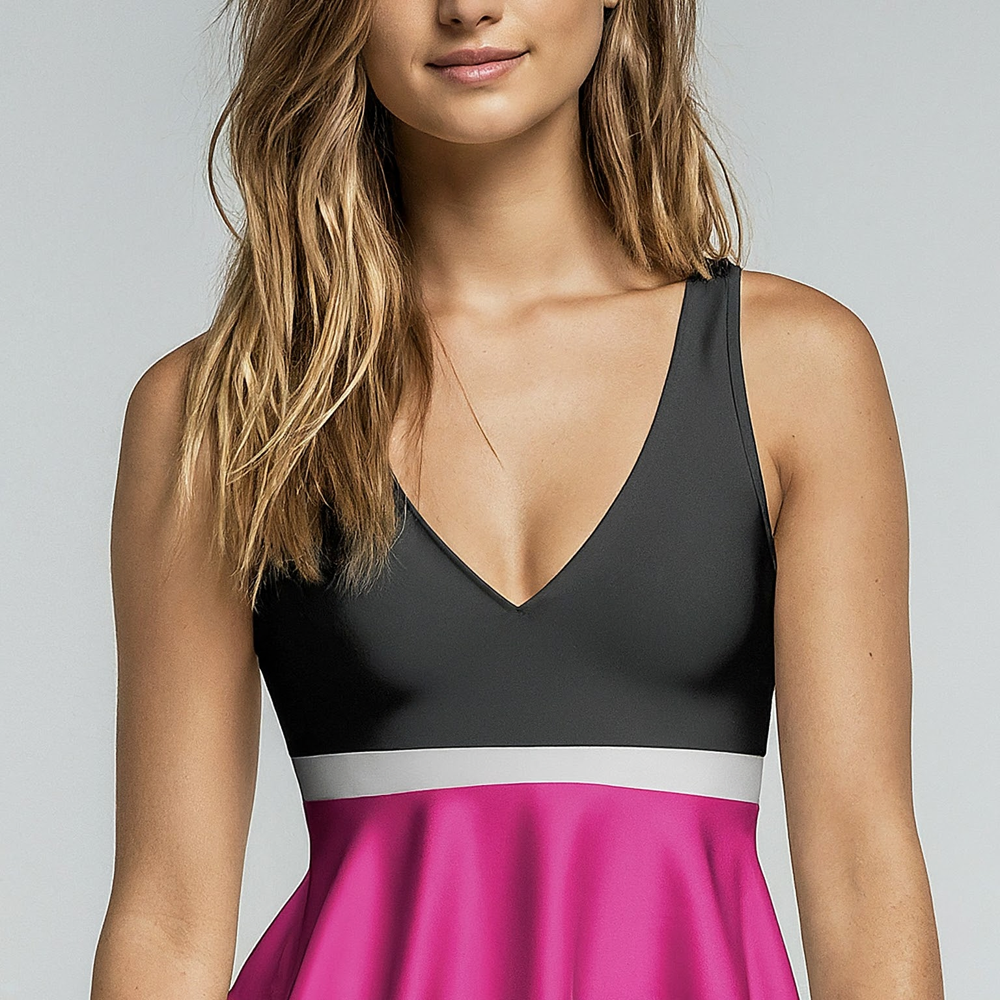

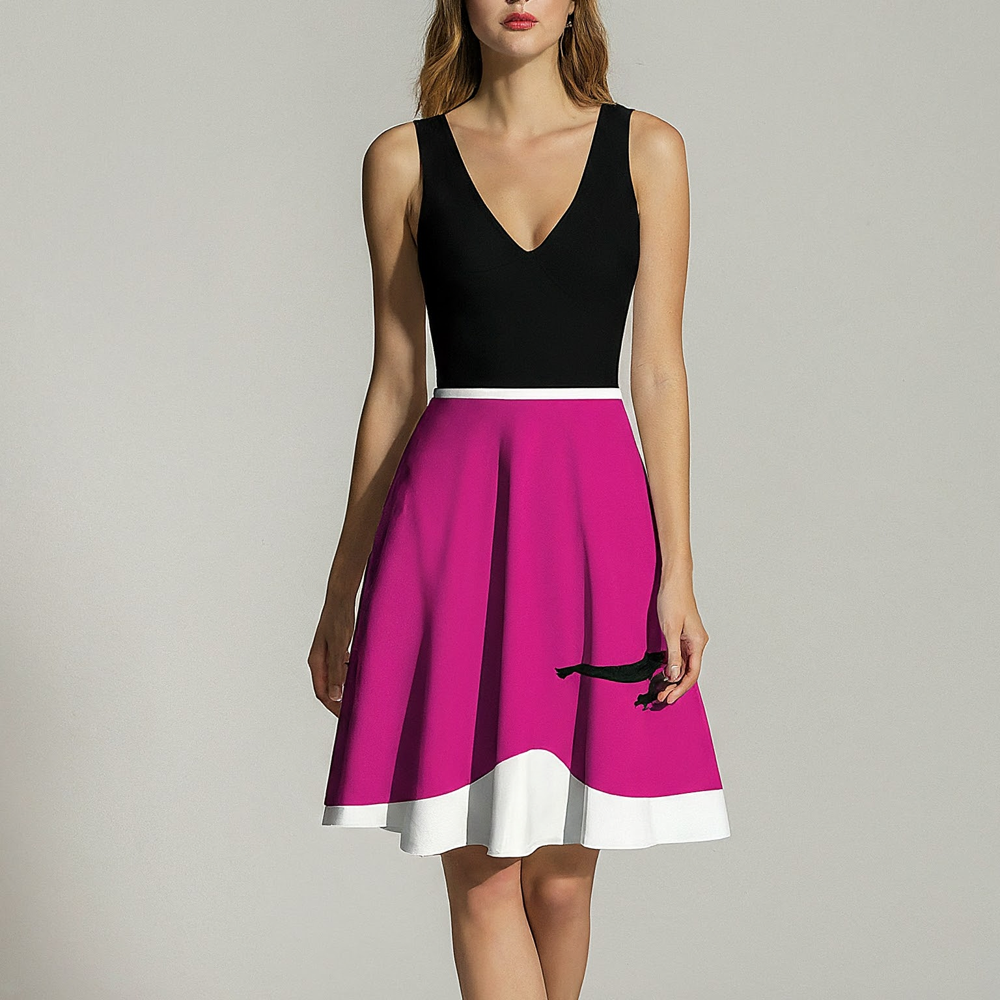

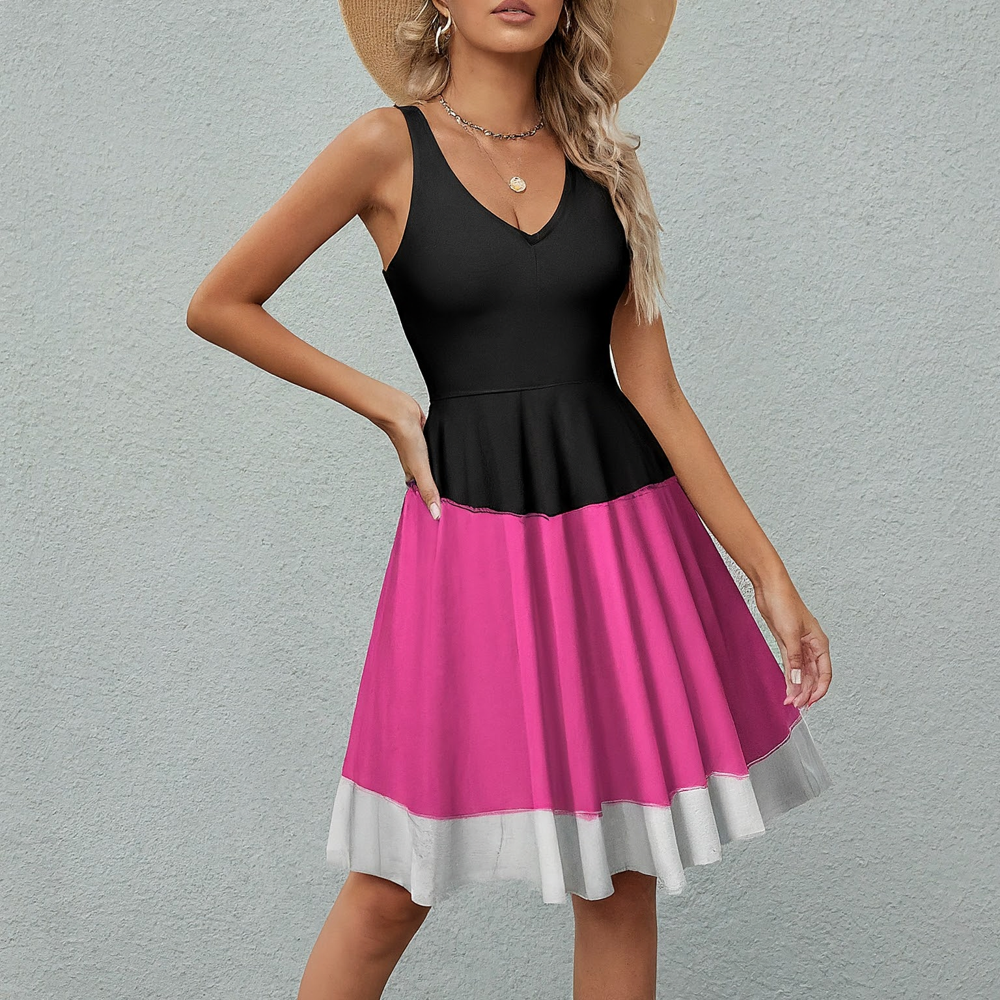

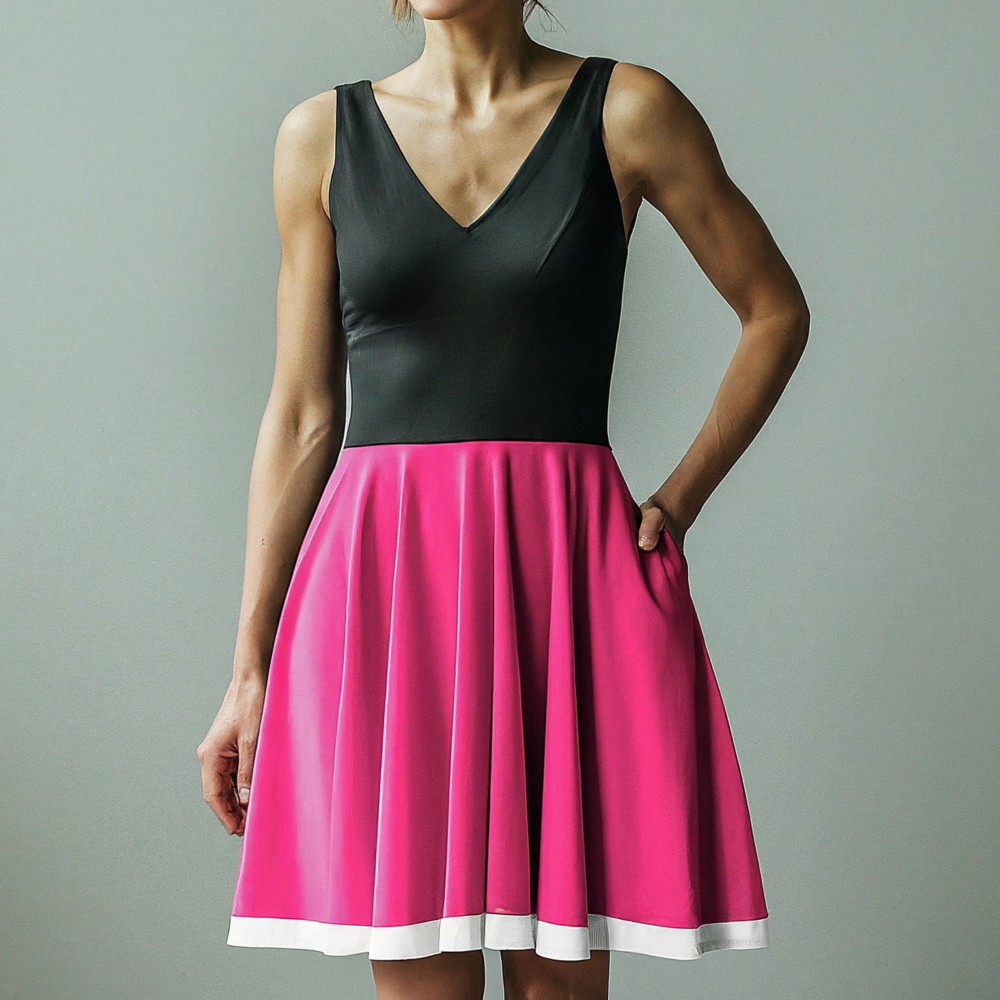

In [31]:
# Display the image in the notebook
from IPython.display import Image, display

# Assuming 'images' is a list of file paths:
images = ['output_image_0.png', 'output_image_1.png', 'output_image_2.png', 'output_image_3.png']

for i, image_path in enumerate(images):
    display(Image(filename=image_path))